<a href="https://colab.research.google.com/github/Natakorn-L/Python-for-investing/blob/main/Gold_Price_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Get news

In [110]:
# !pip install investpy

In [111]:
# import investpy
# print(dir(investpy))

In [112]:
from investpy.news import economic_calendar

news = economic_calendar(
    countries=['United States'],
    importances=['high'],
    from_date='01/01/2015',
    to_date='30/11/2025'
)


In [113]:
news.to_csv('economic_calendar_2015-2025(Nov).csv')


# Get Gold Price

In [16]:
import requests
import pandas as pd
from datetime import datetime, timedelta
import time

API_KEY = "1c5d77dde1cf43558d3ee93a1d80cded"
symbol = "XAU/USD"
interval = "5min"
limit = 5000

url = "https://api.twelvedata.com/time_series"

all_data = []

# เริ่มจากวันนี้
end_time = datetime.utcnow()

while True:
    params = {
        "symbol": symbol,
        "interval": interval,
        "apikey": API_KEY,
        "end_date": end_time.strftime("%Y-%m-%d %H:%M:%S"),
        "limit": limit
    }

    r = requests.get(url, params=params).json()

    if "values" not in r:
        print('values break')
        break

    df = pd.DataFrame(r["values"])
    df["datetime"] = pd.to_datetime(df["datetime"])
    df = df.sort_values("datetime")  # sort ให้เก่าก่อน

    all_data.append(df)

    # ถ้าจำนวนแท่งที่ได้ < limit → หมายถึงดึงถึงขอบข้อมูลแล้ว
    if len(df) < limit:
        print('limit break')
        break

    # set end_time ใหม่ = datetime ที่เก่าที่สุด - 1 วินาที
    oldest = df["datetime"].min()
    end_time = oldest - timedelta(seconds=1)

    print("Fetched:", oldest)

    time.sleep(10)

# รวมทุก batch เข้าด้วยกัน
final_df = pd.concat(all_data).sort_values("datetime")
final_df = final_df.drop_duplicates(subset=["datetime"])

print(final_df.head())
print(final_df.tail())
print(len(final_df), "rows loaded")


/tmp/ipython-input-416154771.py:16: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  end_time = datetime.utcnow()


Fetched: 2025-11-14 09:40:00
Fetched: 2025-10-23 20:15:00
Fetched: 2025-10-02 08:50:00
Fetched: 2025-09-11 00:25:00
Fetched: 2025-08-20 15:55:00
Fetched: 2025-07-30 07:25:00
Fetched: 2025-07-09 05:35:00
Fetched: 2025-06-16 22:55:00
Fetched: 2025-05-24 09:15:00
Fetched: 2025-05-02 18:20:00
Fetched: 2025-04-04 01:20:00
Fetched: 2025-03-10 22:25:00
Fetched: 2025-02-12 17:55:00
Fetched: 2025-01-17 12:25:00
Fetched: 2024-12-20 04:15:00
Fetched: 2024-11-25 20:35:00
Fetched: 2024-10-30 16:35:00
Fetched: 2024-10-04 12:35:00
Fetched: 2024-09-10 09:40:00
Fetched: 2024-08-15 03:10:00
Fetched: 2024-07-20 00:05:00
Fetched: 2024-06-25 17:45:00
Fetched: 2024-05-30 08:35:00
Fetched: 2024-05-03 22:25:00
Fetched: 2024-04-09 16:45:00
Fetched: 2024-03-13 13:50:00
Fetched: 2024-02-16 05:40:00
Fetched: 2024-01-22 22:45:00
Fetched: 2023-12-23 02:15:00
Fetched: 2023-11-28 17:25:00
Fetched: 2023-11-02 02:00:00
Fetched: 2023-10-06 19:20:00
Fetched: 2023-09-12 15:40:00
Fetched: 2023-08-17 10:30:00
Fetched: 2023-

In [17]:
final_df

,datetime,open,high,low,close
152,2020-03-16 12:10:00,1537.37000,1538.64001,1533.21997,1533.21997
151,2020-03-16 12:15:00,1532.90002,1535.71997,1532.69995,1534.65002
150,2020-03-16 12:20:00,1534.58997,1534.94995,1531.18005,1531.18005
149,2020-03-16 12:25:00,1531.43005,1531.43005,1524.90002,1530.34998
148,2020-03-16 12:30:00,1530.38000,1532.85999,1529.83997,1532.21997
...,...,...,...,...,...
4,2025-12-04 17:55:00,4188.7971,4189.7784,4187.79164,4189.3466
3,2025-12-04 18:00:00,4189.16336,4189.73782,4187.7321,4187.88309
2,2025-12-04 18:05:00,4187.90011,4192.71185,4187.80344,4190.86692
1,2025-12-04 18:10:00,4190.67752,4190.98277,4189.11944,4190.32089


In [18]:
final_df.to_csv('GoldPriceDataset.csv')

# Transform Price Dataframe

In [239]:
price = final_df.copy()

In [240]:
price = price.astype({'close':float})

In [244]:
price["datetime"] = pd.to_datetime(price["datetime"])
price = price.sort_values("datetime")
price = price.astype({'close':float,'open':float,'high':float,'low':float})
price['return'] = price.close.pct_change()

In [245]:
price["up_move"] = price["high"] - price["open"]
price["down_move"] = price["open"] - price["low"]

# เลือกทิศทางที่แรงกว่า
price["dominant_move"] = price[["up_move", "down_move"]].max(axis=1)

# เพิ่มเครื่องหมายทิศทาง (+ ขึ้น / - ลง)
price["dominant_move_signed"] = price.apply(
    lambda row: row["up_move"] if row["up_move"] >= row["down_move"] else -row["down_move"],
    axis=1
)

# คิดเป็น return
price["dominant_return"] = price["dominant_move_signed"] / price["open"]


In [246]:
news['date'] = pd.to_datetime(news['date'], format='%d/%m/%Y')
# แทนค่า 'All Day' ด้วยเวลาเริ่มต้น
news['time'] = news['time'].replace('All Day', '00:00')
# รวม date + time
news['date'] = news['date'] + pd.to_timedelta(news['time'] + ':00', errors='coerce')

## merge_dataframes

In [250]:
merged_df = pd.merge(price, news, left_on='datetime', right_on='date', how='left')

In [254]:
merged_df = merged_df[
    ['datetime'
     , 'open'
     , 'high'
     , 'low'
     , 'close'
     , 'return'
     , 'up_move'
     , 'down_move'
     , 'dominant_move'
     , 'dominant_move_signed'
     , 'dominant_return'
     , 'importance'
     , 'event'
     , 'actual'
     , 'forecast'
     ,'previous'
     ]
    ]

In [255]:
merged_df['next_close'] = merged_df['close'].shift(-1)
merged_df['price_change_after_news'] = merged_df.apply(lambda row: (row['next_close'] - row['close'] if pd.notna(row['importance']) else pd.NA) / row['close'], axis=1)

In [256]:
import numpy as np
import pandas as pd

def parse_value(x):
    if pd.isna(x) or x is None:
        return np.nan

    x = str(x).replace(",", "").strip()

    # case: end with K (thousand)
    if x.endswith("K"):
        return float(x[:-1]) * 1_000

    # case: end with M (million)
    if x.endswith("M"):
        return float(x[:-1]) * 1_000_000

    # case: pure number
    try:
        return float(x)
    except:
        return np.nan


In [257]:
cols = ["actual", "forecast", "previous"]

for c in cols:
    merged_df[c] = merged_df[c].apply(parse_value)


## Event Dataframe

In [258]:
event = merged_df[merged_df['event'].notnull() & merged_df['importance'].notnull() & merged_df['actual'].notnull() & merged_df['forecast'].notnull() & merged_df['previous'].notnull()]
event['event'] = (
    event['event'].str.extract(r'^(.*?)\s*\(')[0]
    .fillna(event['event'])
    .str.strip()
)
event['surprise'] = event['actual'] - event['forecast']


/tmp/ipython-input-3272570028.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipython-input-3272570028.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [259]:
event

,datetime,open,high,low,close,return,up_move,down_move,dominant_move,dominant_move_signed,dominant_return,importance,event,actual,forecast,previous,next_close,price_change_after_news,surprise
458,2020-03-18 04:00:00,1527.44995,1531.33997,1526.81995,1529.58997,0.001408,3.89002,0.63000,3.89002,3.89002,0.002547,high,JOLTS Job Openings,6963000.0,6476000.0,6552000.0,1528.56006,-0.000673,487000.0
746,2020-03-19 05:00:00,1488.50000,1489.22998,1484.23999,1484.43994,-0.002915,0.72998,4.26001,4.26001,-4.26001,-0.002862,high,Crude Oil Inventories,1954000.0,3256000.0,7664000.0,1482.73999,-0.001145,-1302000.0
974,2020-03-20 01:00:00,1481.12000,1486.58997,1478.63000,1485.78003,0.003106,5.46997,2.49000,5.46997,5.46997,0.003693,high,Initial Jobless Claims,281000.0,220000.0,211000.0,1485.78003,0.0,61000.0
975,2020-03-20 01:00:00,1481.12000,1486.58997,1478.63000,1485.78003,0.003106,5.46997,2.49000,5.46997,5.46997,0.003693,high,Philadelphia Fed Manufacturing Index,-12.7,10.0,36.7,1484.35999,-0.000956,-22.7
1287,2020-03-21 04:00:00,1486.66003,1486.91003,1485.01001,1485.01001,-0.001708,0.25000,1.65002,1.65002,-1.65002,-0.001110,high,Existing Home Sales,5770000.0,5500000.0,5420000.0,1483.94995,-0.000714,270000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
408151,2025-11-22 05:30:00,4080.95807,4081.06078,4076.43988,4079.08411,-0.000467,0.10271,4.51819,4.51819,-4.51819,-0.001107,high,S&P Global Services PMI,55.0,54.6,54.8,4080.19041,0.000271,0.4
409023,2025-11-26 06:00:00,4137.25592,4141.11795,4131.36954,4135.31005,-0.000443,3.86203,5.88638,5.88638,-5.88638,-0.001423,high,CB Consumer Confidence,88.7,93.5,95.5,4137.97625,0.000645,-4.8
409276,2025-11-27 03:00:00,4164.02072,4165.65456,4161.76658,4162.61036,-0.000362,1.63384,2.25414,2.25414,-2.25414,-0.000541,high,Initial Jobless Claims,216000.0,226000.0,222000.0,4162.30364,-0.000074,-10000.0
409306,2025-11-27 05:30:00,4168.35800,4168.37581,4161.22509,4162.56851,-0.001398,0.01781,7.13291,7.13291,-7.13291,-0.001711,high,Chicago PMI,36.3,44.3,43.8,4162.05370,-0.000124,-8.0


In [260]:
event_non_farm = event[event['event'].str.contains('Nonfarm Payroll')]

In [261]:
event_non_farm

,datetime,open,high,low,close,return,up_move,down_move,dominant_move,dominant_move_signed,dominant_return,importance,event,actual,forecast,previous,next_close,price_change_after_news,surprise
3819,2020-04-04 01:00:00,1614.270020,1615.469970,1613.68005,1614.96997,-0.000192,1.19995,0.589970,1.199950,1.199950,0.000743,high,Nonfarm Payrolls,-701000.0,-100000.0,275000.0,1614.96997,0.0,-601000.0
10334,2020-05-09 01:00:00,1715.489990,1717.800050,1714.98999,1715.13000,-0.000274,2.31006,0.500000,2.310060,2.310060,0.001347,high,Nonfarm Payrolls,-20537000.0,-22000000.0,-870000.0,1715.13000,0.0,1463000.0
15815,2020-06-06 01:00:00,1675.370000,1677.510010,1675.20996,1676.95996,0.001110,2.14001,0.160040,2.140010,2.140010,0.001277,high,Nonfarm Payrolls,2509000.0,-8000000.0,-20687000.0,1676.95996,0.0,10509000.0
21086,2020-07-03 01:00:00,1775.719970,1776.839970,1775.34998,1776.31006,0.000355,1.12000,0.369990,1.120000,1.120000,0.000631,high,Nonfarm Payrolls,4800000.0,3000000.0,2699000.0,1776.31006,0.0,1800000.0
28228,2020-08-08 01:00:00,2039.040039,2039.040039,2034.30005,2037.48999,-0.000638,0.00000,4.739989,4.739989,-4.739989,-0.002325,high,Nonfarm Payrolls,1763000.0,1600000.0,4791000.0,2037.48999,0.0,163000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369096,2025-06-07 01:00:00,3325.790000,3327.140000,3324.52000,3324.93000,-0.000352,1.35000,1.270000,1.350000,1.350000,0.000406,high,Nonfarm Payrolls,139000.0,126000.0,158000.0,3324.93000,0.0,13000.0
375111,2025-07-04 01:00:00,3324.739990,3325.570070,3323.20996,3325.25000,0.000147,0.83008,1.530030,1.530030,-1.530030,-0.000460,high,Nonfarm Payrolls,147000.0,111000.0,19000.0,3325.25000,0.0,36000.0
381935,2025-08-02 01:00:00,3348.060000,3349.080000,3344.06000,3346.04000,-0.000406,1.02000,4.000000,4.000000,-4.000000,-0.001195,high,Nonfarm Payrolls,73000.0,106000.0,-13000.0,3346.04000,0.0,-33000.0
390111,2025-09-06 01:00:00,3590.380000,3591.470000,3587.95000,3591.47000,0.000318,1.09000,2.430000,2.430000,-2.430000,-0.000677,high,Nonfarm Payrolls,22000.0,75000.0,79000.0,3591.47000,0.0,-53000.0


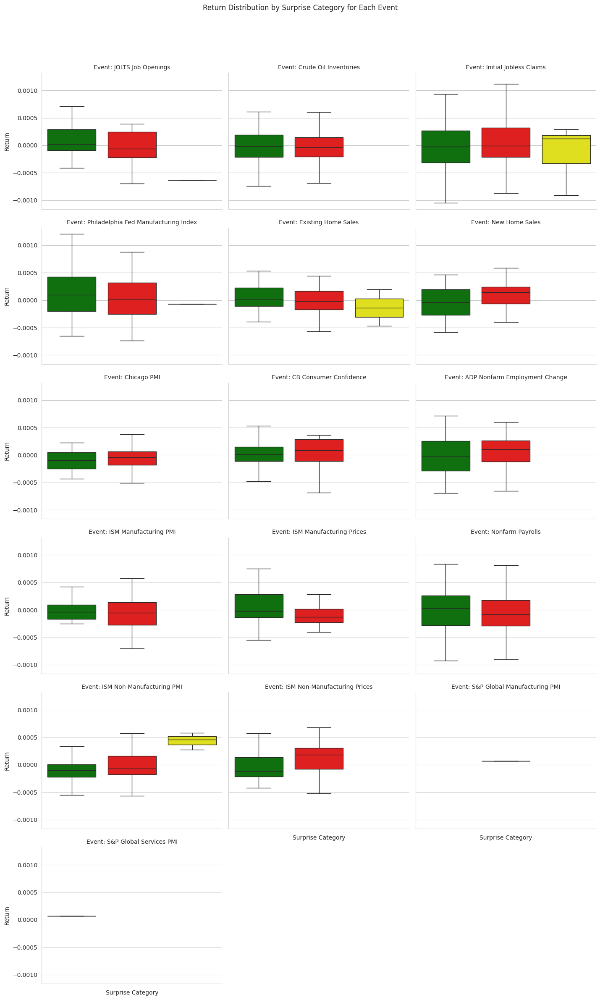

In [237]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create surprise_category in a copy of event to avoid SettingWithCopyWarning
event_plot_df = event.copy()

event_plot_df['surprise_category'] = np.select(
    [event_plot_df['surprise'] > 0, event_plot_df['surprise'] < 0],
    ['Positive Surprise', 'Negative Surprise'],
    default='Neutral Surprise'
)

# Define a custom color palette
color_palette = {
    'Positive Surprise': 'green',
    'Negative Surprise': 'red',
    'Neutral Surprise': 'yellow'
}

# Set the style for the plot
sns.set_style("whitegrid")

# Create a FacetGrid for each event
g = sns.catplot(
    data=event_plot_df,
    x='surprise_category',
    y='return',
    hue='surprise_category', # Assign hue to the same variable as x for coloring
    col='event',
    col_wrap=3, # Adjust based on number of unique events for better layout
    kind='box',
    height=4, # Height of each facet
    aspect=1.2, # Aspect ratio of each facet
    sharey=True, # Share the y-axis scale across plots
    showfliers=False, # Do not show outliers to keep the plot clean
    palette=color_palette, # Apply the custom color palette
    legend=False # Hide the redundant legend
)

# Rotate x-axis labels for better readability
g.set_xticklabels(rotation=45, ha='right')

# Set titles and labels
g.set_axis_labels("Surprise Category", "Return")
g.set_titles("Event: {col_name}")
plt.suptitle('Return Distribution by Surprise Category for Each Event', y=1.02) # Adjust suptitle position
plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to prevent suptitle overlap
plt.show()

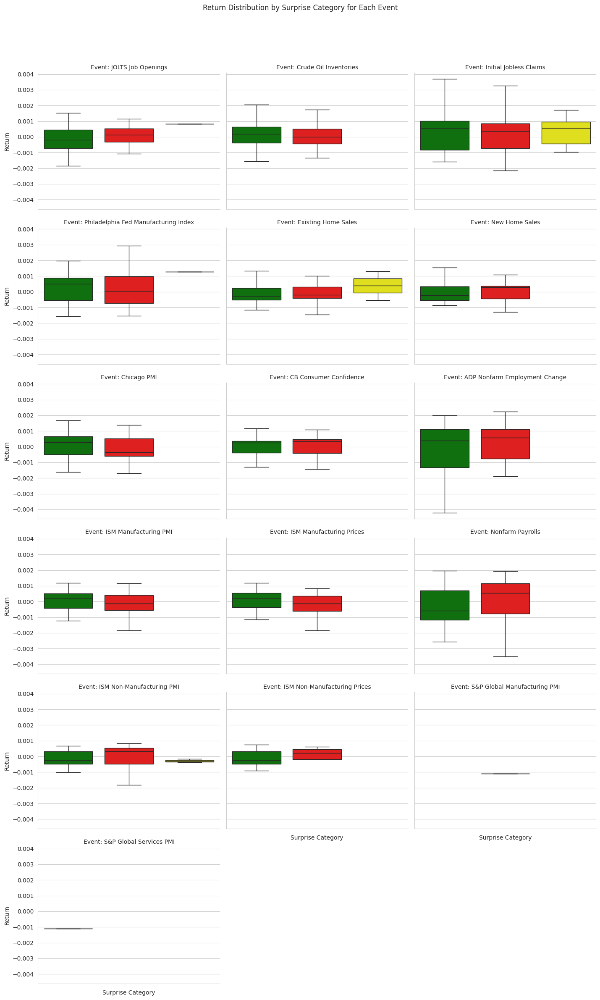

In [262]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create surprise_category in a copy of event to avoid SettingWithCopyWarning
event_plot_df = event.copy()

event_plot_df['surprise_category'] = np.select(
    [event_plot_df['surprise'] > 0, event_plot_df['surprise'] < 0],
    ['Positive Surprise', 'Negative Surprise'],
    default='Neutral Surprise'
)

# Define a custom color palette
color_palette = {
    'Positive Surprise': 'green',
    'Negative Surprise': 'red',
    'Neutral Surprise': 'yellow'
}

# Set the style for the plot
sns.set_style("whitegrid")

# Create a FacetGrid for each event
g = sns.catplot(
    data=event_plot_df,
    x='surprise_category',
    y='dominant_return',
    hue='surprise_category', # Assign hue to the same variable as x for coloring
    col='event',
    col_wrap=3, # Adjust based on number of unique events for better layout
    kind='box',
    height=4, # Height of each facet
    aspect=1.2, # Aspect ratio of each facet
    sharey=True, # Share the y-axis scale across plots
    showfliers=False, # Do not show outliers to keep the plot clean
    palette=color_palette, # Apply the custom color palette
    legend=False # Hide the redundant legend
)

# Rotate x-axis labels for better readability
g.set_xticklabels(rotation=45, ha='right')

# Set titles and labels
g.set_axis_labels("Surprise Category", "Return")
g.set_titles("Event: {col_name}")
plt.suptitle('Return Distribution by Surprise Category for Each Event', y=1.02) # Adjust suptitle position
plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to prevent suptitle overlap
plt.show()

# EDA

## Gold Price Chart

<Axes: xlabel='datetime'>

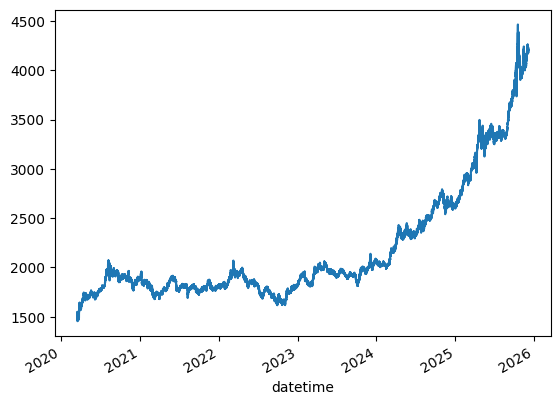

In [39]:
price.set_index('datetime').close.plot()

In [29]:
import plotly.express as px

fig = px.line(price, x='datetime', y='close', title='Close Price Over Time')
fig.show()

<Axes: xlabel='datetime'>

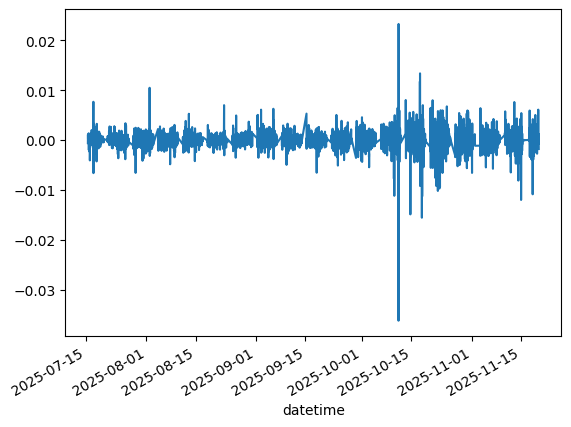

In [ ]:
df.set_index('datetime')['return'].plot()

## Bar Plot

### Bar Plot 1

In [ ]:
df['hour_decimal'] = df['datetime'].dt.hour + df['datetime'].dt.minute / 60
# df['time_bin'] = (df['hour_decimal'] // 0.25) * 0.25
bins = np.arange(0, 24.01, 1)  # ช่วงละ 1 ชั่วโมง
df['hour_bin'] = pd.cut(df['hour_decimal'], bins, right=False)

volatility_by_hour = df.groupby('hour_bin')['return'].std().reset_index()
volatility_by_hour.columns = ['hour_range', 'price_std']
# volatility_by_hour = volatility_by_hour.groupby('hour_range')['price_std'].apply(list).reset_index()

C:\Users\Goods\AppData\Local\Temp\ipykernel_21084\415567454.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  volatility_by_hour = df.groupby('hour_bin')['return'].std().reset_index()


In [ ]:
df

,datetime,open,high,low,close
4999,2025-07-15 11:00:00,3347.5,3349.88989,3347.06,3348.42993
4998,2025-07-15 11:30:00,3348.24,3350.67993,3346.1,3346.41000
4997,2025-07-15 12:00:00,3346.46,3352.080078,3345.79,3350.07000
4996,2025-07-15 12:30:00,3349.70996,3351.18994,3347.59,3350.98999
4995,2025-07-15 13:00:00,3350.83,3355.9,3350.61,3354.52000
...,...,...,...,...,...
4,2025-11-19 22:00:00,4108.9421,4116.58,4105.97555,4113.98697
3,2025-11-19 22:30:00,4114.10691,4116.58562,4111.5068,4113.35067
2,2025-11-19 23:00:00,4113.31221,4119.789,4112.91243,4116.45691
1,2025-11-19 23:30:00,4116.38913,4119.14924,4113.00372,4114.96844


In [ ]:
df['hour_decimal'] = df['datetime'].dt.hour + df['datetime'].dt.minute / 60
# df['time_bin'] = (df['hour_decimal'] // 0.25) * 0.25
bins = np.arange(0, 24.01, 1)  # ช่วงละ 1 ชั่วโมง
df['hour_bin'] = pd.cut(df['hour_decimal'], bins, right=False)

volatility_by_hour = df.groupby('hour_bin')['close'].std().reset_index()
volatility_by_hour.columns = ['hour_range', 'price_std']
# volatility_by_hour = volatility_by_hour.groupby('hour_range')['price_std'].apply(list).reset_index()



C:\Users\Goods\AppData\Local\Temp\ipykernel_21084\623139538.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  volatility_by_hour = df.groupby('hour_bin')['close'].std().reset_index()


In [ ]:
volatility_by_hour

,hour_range,price_std
0,"[0.0, 1.0)",0.002476
1,"[1.0, 2.0)",0.002266
2,"[2.0, 3.0)",0.001647
3,"[3.0, 4.0)",0.001672
4,"[4.0, 5.0)",0.001435
5,"[5.0, 6.0)",0.001447
6,"[6.0, 7.0)",0.001489
7,"[7.0, 8.0)",0.001388
8,"[8.0, 9.0)",0.003129
9,"[9.0, 10.0)",0.001564


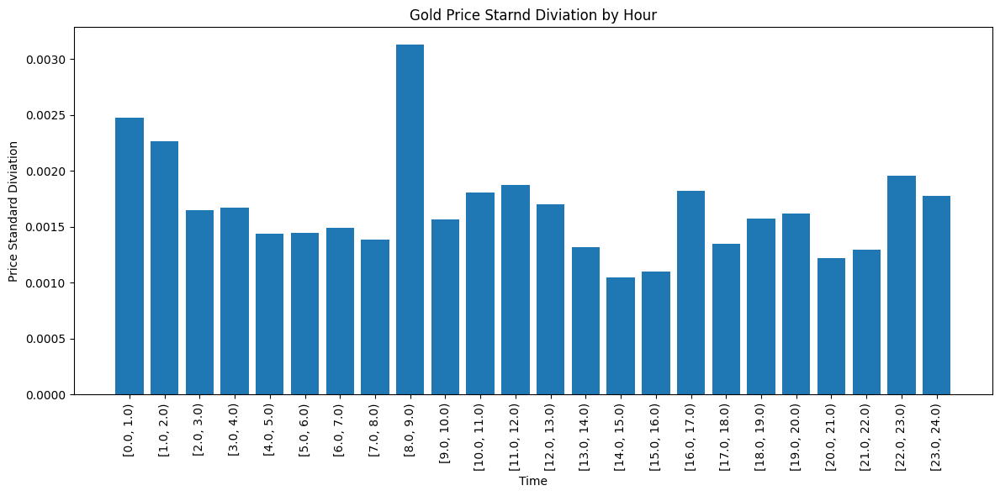

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.bar(volatility_by_hour['hour_range'].astype(str), volatility_by_hour['price_std'])
plt.xticks(rotation=90)
plt.xlabel('Time')
plt.ylabel('Price Standard Diviation')
plt.title('Gold Price Starnd Diviation by Hour')
plt.tight_layout()
plt.show()

### Bar Plot 2

In [ ]:
# Step 1: Extract date and hour
df['Date'] = df['datetime'].dt.date
df['Hour'] = df['datetime'].dt.hour
df['hour_decimal'] = df['datetime'].dt.hour + df['datetime'].dt.minute / 60
# df['time_bin'] = (df['hour_decimal'] // 0.25) * 0.25
bins = np.arange(0, 24.01, 1)  # ช่วงละ 1 ชั่วโมง
df['hour_bin'] = pd.cut(df['hour_decimal'], bins, right=False)

volatility_by_hour = df.groupby('Hour')['return'].std().reset_index()
volatility_by_hour.columns = ['Hour', 'price_std']
# volatility_by_hour = volatility_by_hour.groupby('hour_range')['price_std'].apply(list).reset_index()



In [ ]:
# Step 1: Extract date and hour
df['Date'] = df['datetime'].dt.date
df['Hour'] = df['datetime'].dt.hour
df['hour_decimal'] = df['datetime'].dt.hour + df['datetime'].dt.minute / 60
# df['time_bin'] = (df['hour_decimal'] // 0.25) * 0.25
bins = np.arange(0, 24.01, 1)  # ช่วงละ 1 ชั่วโมง
df['hour_bin'] = pd.cut(df['hour_decimal'], bins, right=False)

volatility_by_hour = df.groupby('Hour')['close'].std().reset_index()
volatility_by_hour.columns = ['Hour', 'price_std']
# volatility_by_hour = volatility_by_hour.groupby('hour_range')['price_std'].apply(list).reset_index()



In [ ]:
df

,datetime,open,high,low,close,return,hour_decimal,hour_bin,Date,Hour
4999,2025-07-15 11:00:00,3347.5,3349.88989,3347.06,3348.42993,NaN,11.0,"[11.0, 12.0)",2025-07-15,11
4998,2025-07-15 11:30:00,3348.24,3350.67993,3346.1,3346.41000,-0.000603,11.5,"[11.0, 12.0)",2025-07-15,11
4997,2025-07-15 12:00:00,3346.46,3352.080078,3345.79,3350.07000,0.001094,12.0,"[12.0, 13.0)",2025-07-15,12
4996,2025-07-15 12:30:00,3349.70996,3351.18994,3347.59,3350.98999,0.000275,12.5,"[12.0, 13.0)",2025-07-15,12
4995,2025-07-15 13:00:00,3350.83,3355.9,3350.61,3354.52000,0.001053,13.0,"[13.0, 14.0)",2025-07-15,13
...,...,...,...,...,...,...,...,...,...,...
4,2025-11-19 22:00:00,4108.9421,4116.58,4105.97555,4113.98697,0.001241,22.0,"[22.0, 23.0)",2025-11-19,22
3,2025-11-19 22:30:00,4114.10691,4116.58562,4111.5068,4113.35067,-0.000155,22.5,"[22.0, 23.0)",2025-11-19,22
2,2025-11-19 23:00:00,4113.31221,4119.789,4112.91243,4116.45691,0.000755,23.0,"[23.0, 24.0)",2025-11-19,23
1,2025-11-19 23:30:00,4116.38913,4119.14924,4113.00372,4114.96844,-0.000362,23.5,"[23.0, 24.0)",2025-11-19,23


,Hour,price_std
0,0,0.001466
1,1,0.001568
2,2,0.001183
3,3,0.000986
4,4,0.001018
5,5,0.001015
6,6,0.000891
7,7,0.000940
8,8,0.001202
9,9,0.000969


In [ ]:
# Step 1: Extract date and hour
df['Date'] = df['datetime'].dt.date
df['Hour'] = df['datetime'].dt.hour

# Step 2: Group by Date and Hour, compute std of Price
volatility_by_hour = df.groupby(['Date', 'Hour'])['return'].std().reset_index()
volatility_by_hour.columns = ['Date','Hour', 'price_std']
avg_std = volatility_by_hour.groupby(['Hour'])['price_std'].mean().reset_index()

In [ ]:
# Step 1: Extract date and hour
df['Date'] = df['datetime'].dt.date
df['Hour'] = df['datetime'].dt.hour

# Step 2: Group by Date and Hour, compute std of Price
volatility_by_hour = df.groupby(['Date', 'Hour'])['close'].std().reset_index()
volatility_by_hour.columns = ['Date','Hour', 'price_std']
avg_std = volatility_by_hour.groupby(['Hour'])['price_std'].mean().reset_index()

In [ ]:
volatility_by_hour

,Date,Hour,price_std
0,2025-07-15,11,1.428306
1,2025-07-15,12,0.650531
2,2025-07-15,13,2.446575
3,2025-07-15,14,0.063640
4,2025-07-15,15,0.926310
...,...,...,...
2504,2025-11-19,20,17.639479
2505,2025-11-19,21,2.398301
2506,2025-11-19,22,0.449932
2507,2025-11-19,23,1.052507


In [ ]:
avg_std

,Hour,price_std
0,0,4.416685
1,1,3.426758
2,2,2.753970
3,3,2.922284
4,4,2.832165
5,5,2.540251
6,6,2.574223
7,7,2.356410
8,8,2.119945
9,9,2.260565


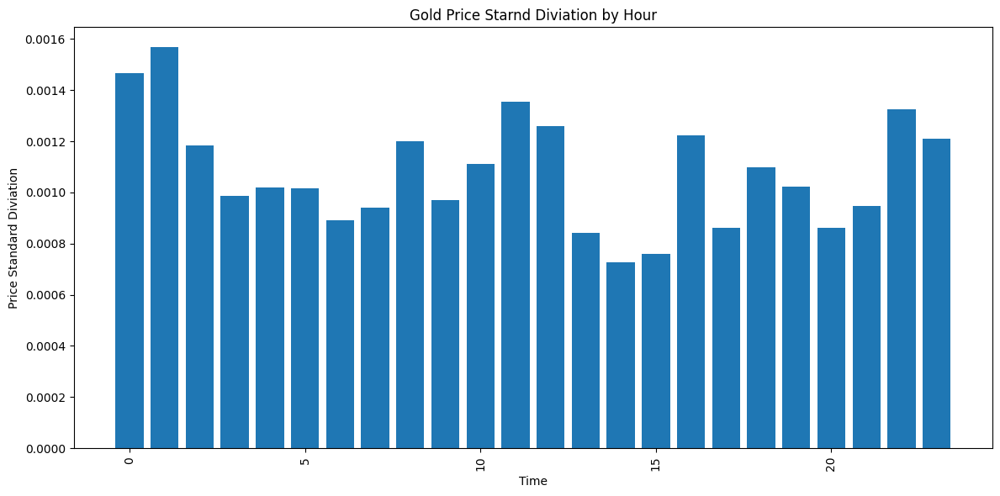

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.bar(avg_std['Hour'], avg_std['price_std'])
plt.xticks(rotation=90)
plt.xlabel('Time')
plt.ylabel('Price Standard Diviation')
plt.title('Gold Price Starnd Diviation by Hour')
plt.tight_layout()
plt.show()

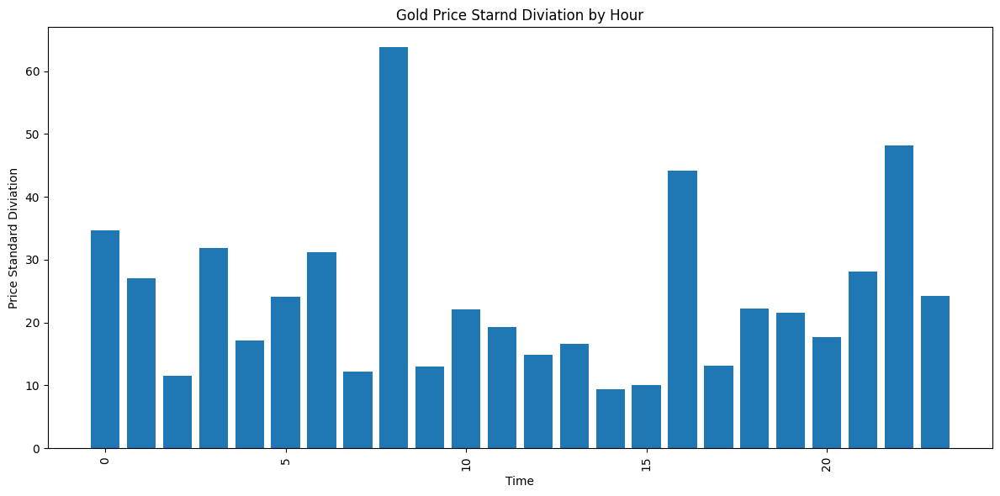

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.bar(volatility_by_hour['Hour'], volatility_by_hour['price_std'])
plt.xticks(rotation=90)
plt.xlabel('Time')
plt.ylabel('Price Standard Diviation')
plt.title('Gold Price Starnd Diviation by Hour')
plt.tight_layout()
plt.show()

## Box Plot

### Box Plot 1

In [ ]:
# Step 1: Extract date and hour
df['Date'] = df['datetime'].dt.date
df['Hour'] = df['datetime'].dt.hour

# Step 2: Group by Date and Hour, compute std of Price
grouped = df.groupby(['Date', 'Hour'])['return'].std().reset_index()
grouped.columns = ['Date', 'Hour', 'Price_STD']

# Step 3: Pivot to group all std values by Hour
volatility_by_hour = grouped.groupby('Hour')['Price_STD'].apply(list).reset_index()


In [ ]:
# Step 1: Extract date and hour
df['Date'] = df['datetime'].dt.date
df['Hour'] = df['datetime'].dt.hour

# Step 2: Group by Date and Hour, compute std of Price
grouped = df.groupby(['Date', 'Hour'])['close'].std().reset_index()
grouped.columns = ['Date', 'Hour', 'Price_STD']

# Step 3: Pivot to group all std values by Hour
volatility_by_hour = grouped.groupby('Hour')['Price_STD'].apply(list).reset_index()


In [ ]:
volatility_by_hour

,Hour,Price_STD
0,0,"[0.0005649296320497768, 0.003059912897115318, ..."
1,1,"[0.0015468625731541563, 0.01012000125946312, 0..."
2,2,"[0.0012094450034606512, 0.003437595632472144, ..."
3,3,"[0.0002655347065307008, 0.00044060976303244843..."
4,4,"[0.0008692021567034316, 3.401911844421816e-06,..."
5,5,"[0.0011644846698906238, 0.0010690010437702175,..."
6,6,"[0.0003211007520563061, 0.00019030478190316415..."
7,7,"[0.0008083566323113649, 0.00029605143436663964..."
8,8,"[0.0006902788820284469, 0.0023790712601037835,..."
9,9,"[3.6500247446698554e-05, 1.4188138956354863e-0..."


In [ ]:
# สมมติว่า volatility_by_hour มีคอลัมน์: 'Hour' และ 'Price_STD' (ซึ่งเป็น list ของ std หลายวัน)
# ให้แปลงให้อยู่ในรูปแบบ long format

df_long = volatility_by_hour.explode('Price_STD')  # ใช้ได้เฉพาะเมื่อ Price_STD เป็น list จริง
df_long = df_long.dropna(subset=['Price_STD'])     # ลบค่า NaN ที่อาจเกิดจาก explode

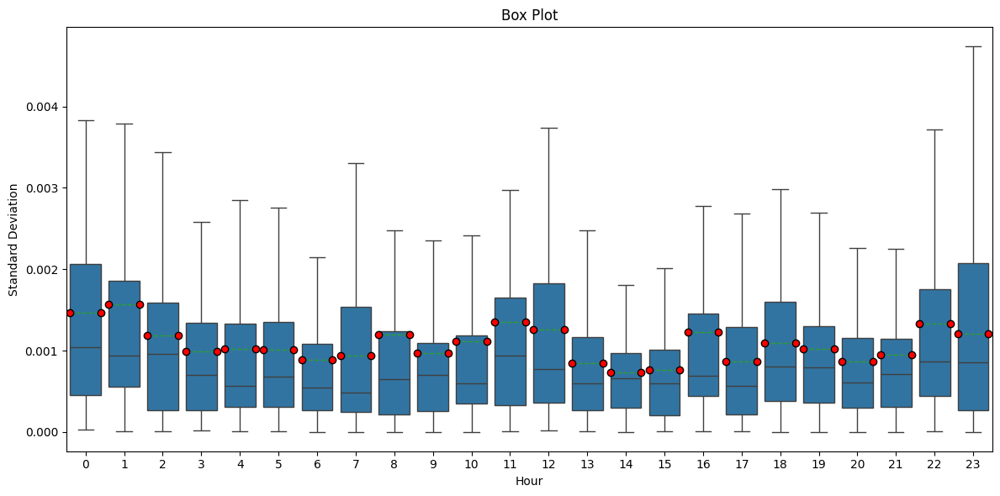

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(
    data=df_long.explode('Price_STD'),
    x='Hour',
    y='Price_STD',
    showfliers=False,
    meanline=True,
    showmeans=True,
    meanprops={"marker":"o", "markerfacecolor":"red", "markeredgecolor":"black"}
)
plt.xlabel('Hour')
plt.ylabel('Standard Deviation')
plt.title('Box Plot')
plt.tight_layout()


### Box Plot 2

In [ ]:
# Step 1: Extract date and hour
df['Date'] = df['datetime'].dt.date
df['Hour'] = df['datetime'].dt.hour

# Step 2: Group by Date and Hour, compute std of Price
grouped = df.groupby(['Date', 'Hour'])['return'].std().reset_index()
grouped.columns = ['Date', 'Hour', 'Price_STD']

# Step 3: Pivot to group all std values by Hour
volatility_by_hour = grouped.groupby('Hour')['Price_STD'].apply(list).reset_index()


In [ ]:
# Step 1: Extract date and hour
df['Date'] = df['datetime'].dt.date
df['Hour'] = df['datetime'].dt.hour

# Step 2: Group by Date and Hour, compute std of Price
grouped = df.groupby(['Date', 'Hour'])['close'].std().reset_index()
grouped.columns = ['Date', 'Hour', 'Price_STD']

# Step 3: Pivot to group all std values by Hour
volatility_by_hour = grouped.groupby('Hour')['Price_STD'].apply(list).reset_index()


In [ ]:
volatility_by_hour

,Hour,Price_STD
0,0,"[0.0005649296320497768, 0.003059912897115318, ..."
1,1,"[0.0015468625731541563, 0.01012000125946312, 0..."
2,2,"[0.0012094450034606512, 0.003437595632472144, ..."
3,3,"[0.0002655347065307008, 0.00044060976303244843..."
4,4,"[0.0008692021567034316, 3.401911844421816e-06,..."
5,5,"[0.0011644846698906238, 0.0010690010437702175,..."
6,6,"[0.0003211007520563061, 0.00019030478190316415..."
7,7,"[0.0008083566323113649, 0.00029605143436663964..."
8,8,"[0.0006902788820284469, 0.0023790712601037835,..."
9,9,"[3.6500247446698554e-05, 1.4188138956354863e-0..."


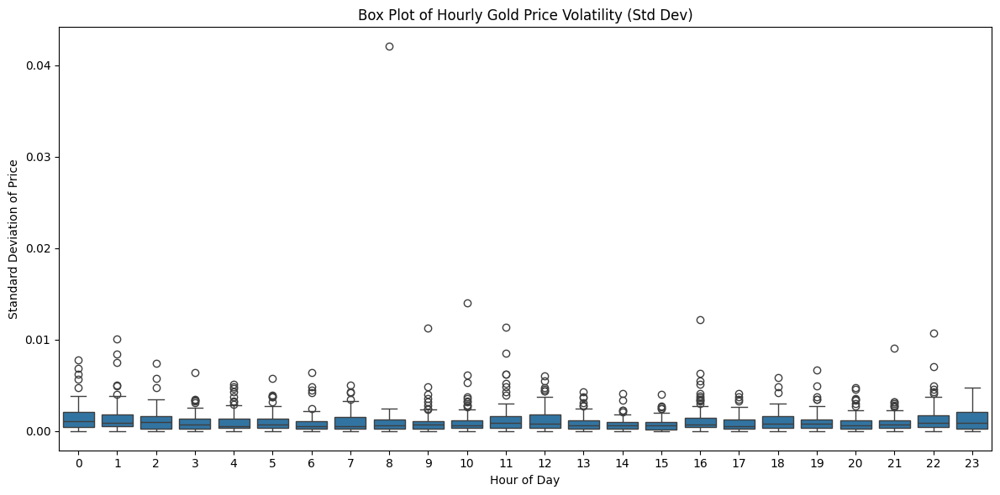

In [ ]:
# แปลงค่าคอลัมน์ให้เป็น numeric (เผื่อมี string ปน)
df_long['Price_STD'] = pd.to_numeric(df_long['Price_STD'], errors='coerce')

# สร้าง boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_long, x='Hour', y='Price_STD')
plt.title('Box Plot of Hourly Gold Price Volatility (Std Dev)')
plt.xlabel('Hour of Day')
plt.ylabel('Standard Deviation of Price')
plt.tight_layout()
plt.show()